<a href="https://colab.research.google.com/github/JingWei-S/home_learning_tree/blob/main/Homework_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up the environment

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.0/107.7 GB disk)


# Testing YOLOv5 with example images

In [2]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images
# display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

detect: weights=['yolov5s.pt'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CPU

100% 14.1M/14.1M [00:00<00:00, 34.6MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 347.6ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 255.3ms
Speed: 2.2ms pre-process, 301.5ms inference, 10.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


# Now use a different dataset

Download Roboflow

In [4]:
%pip install -q roboflow

# import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     |████████████████████████████████| 42 kB 644 kB/s 
     |████████████████████████████████| 67 kB 5.2 MB/s 
     |████████████████████████████████| 138 kB 47.3 MB/s 
     |████████████████████████████████| 178 kB 40.5 MB/s 
     |████████████████████████████████| 145 kB 61.0 MB/s 
     |████████████████████████████████| 54 kB 2.6 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
Setup complete. Using torch 1.13.0+cu116 (CPU)


Download the Thermal Dog and People Dataset from Roboflow

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="{MY_API_KEY}")
project = rf.workspace("joseph-nelson").project("thermal-dogs-and-people")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Thermal-Dogs-and-People-3 in yolov5pytorch:: 100%|██████████| 986/986 [00:00<00:00, 1676.97it/s]


Training the dataset -> using only 30 epochs

In [8]:
!python train.py --img 416 --batch 16 --epochs 30 --data /content/datasets/Thermal-Dogs-and-People-3/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Thermal-Dogs-and-People-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=

Visulizations

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [10]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 416 --conf 0.1 --source /content/datasets/Thermal-Dogs-and-People-3/test/images

detect: weights=['runs/train/exp3/weights/best.pt'], source=/content/datasets/Thermal-Dogs-and-People-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-33-g1752768 Python-3.8.16 torch-1.13.0+cu116 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/datasets/Thermal-Dogs-and-People-3/test/images/IMG_0002 4_jpg.rf.4c2b958cb5cee437006841da59b83a13.jpg: 416x320 2 persons, 163.8ms
image 2/20 /content/datasets/Thermal-Dogs-and-People-3/test/images/IMG_0006 5_jpg.rf.adf2bfa382f8a74dbdbb8e0f74943446.jpg: 320x416 1 dog, 1 person, 153.8ms
image 3/20 /content/datasets/

# Some results!

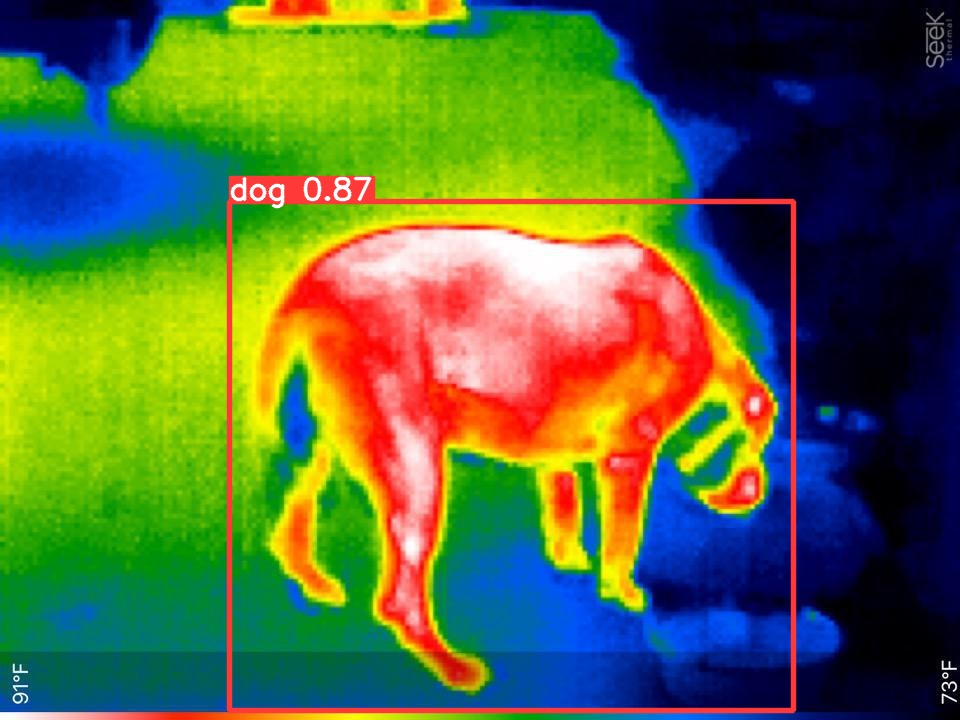

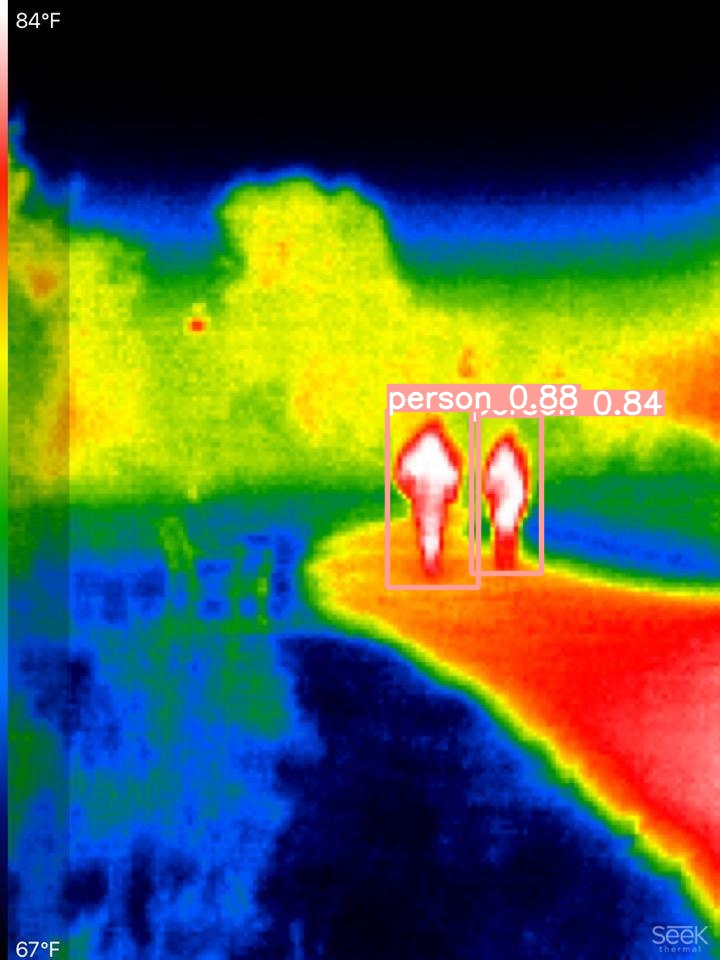

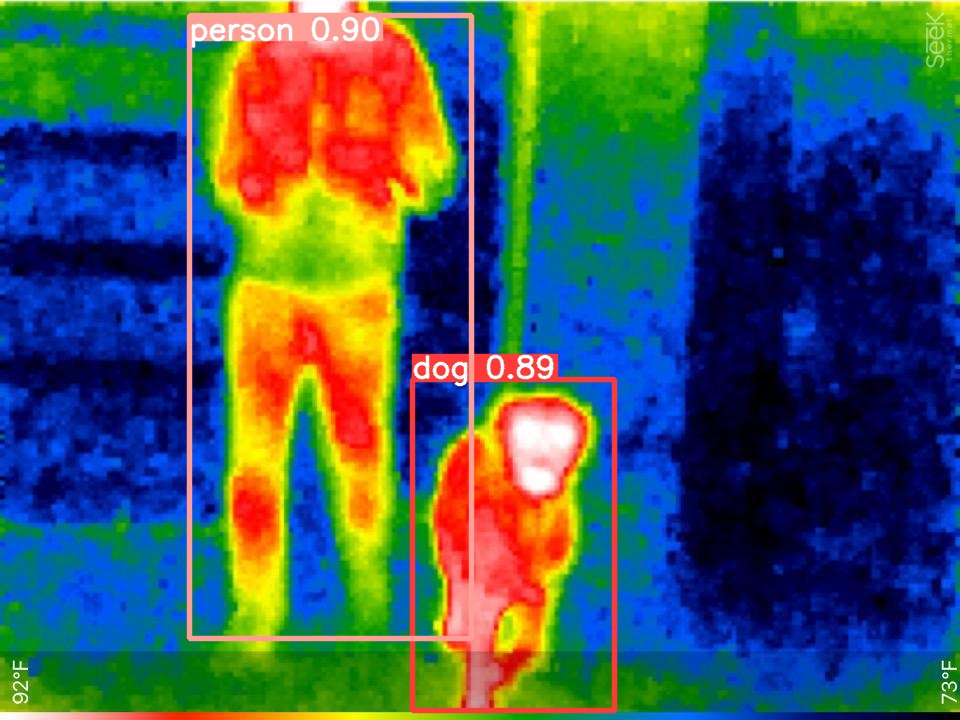

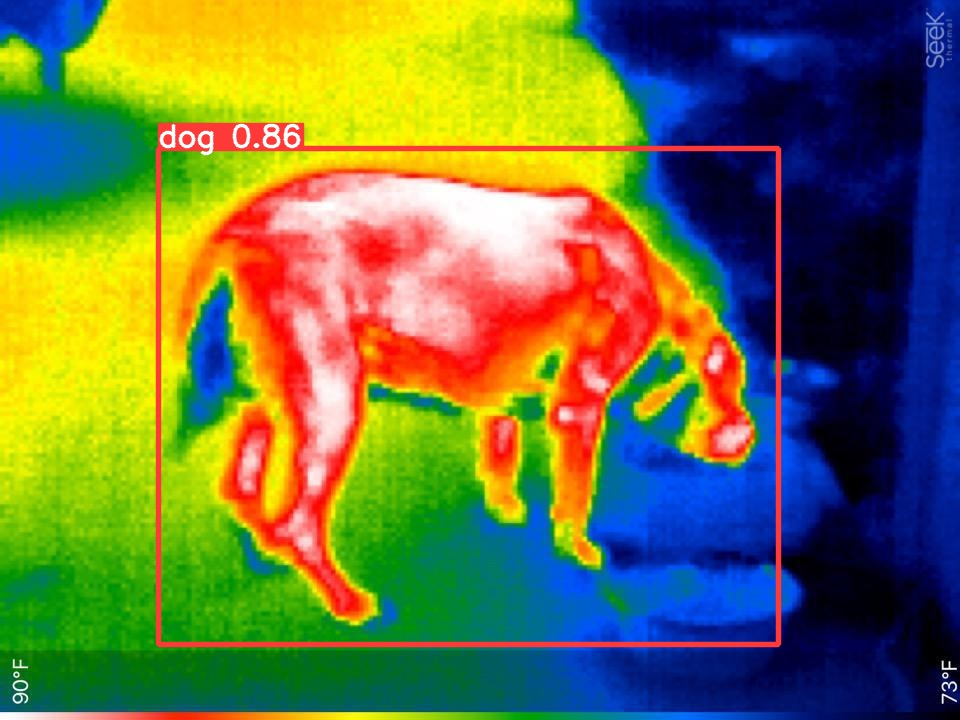

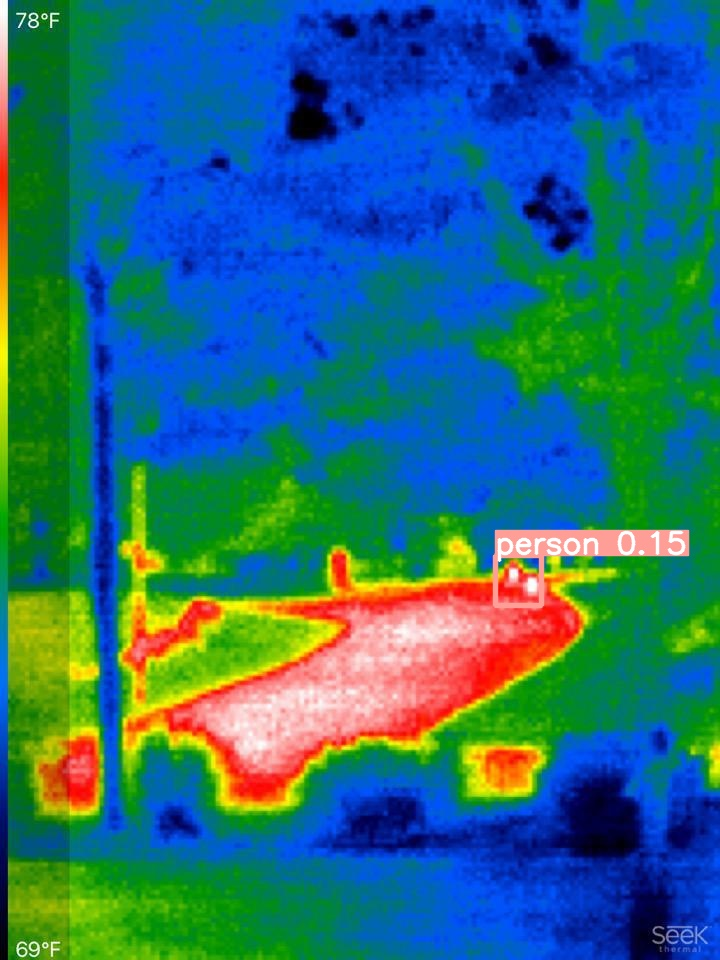

...

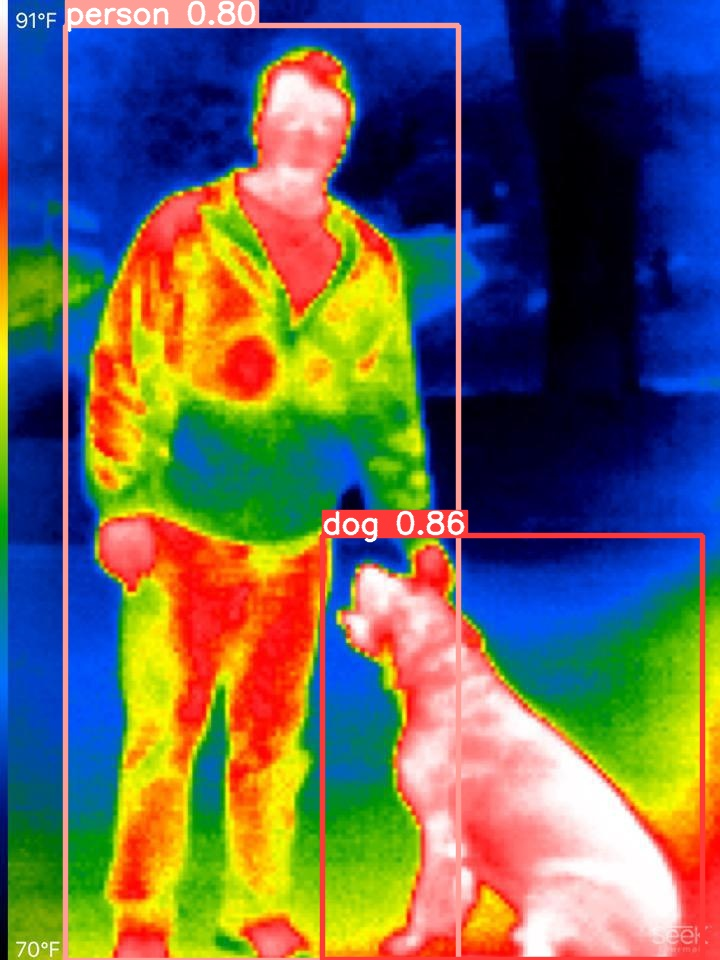

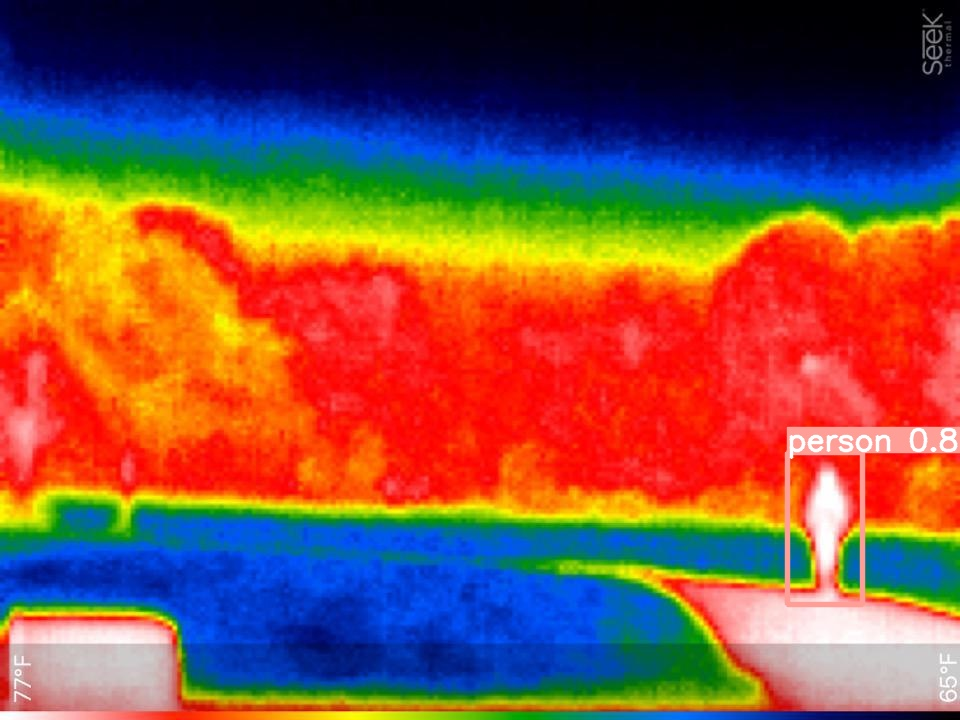

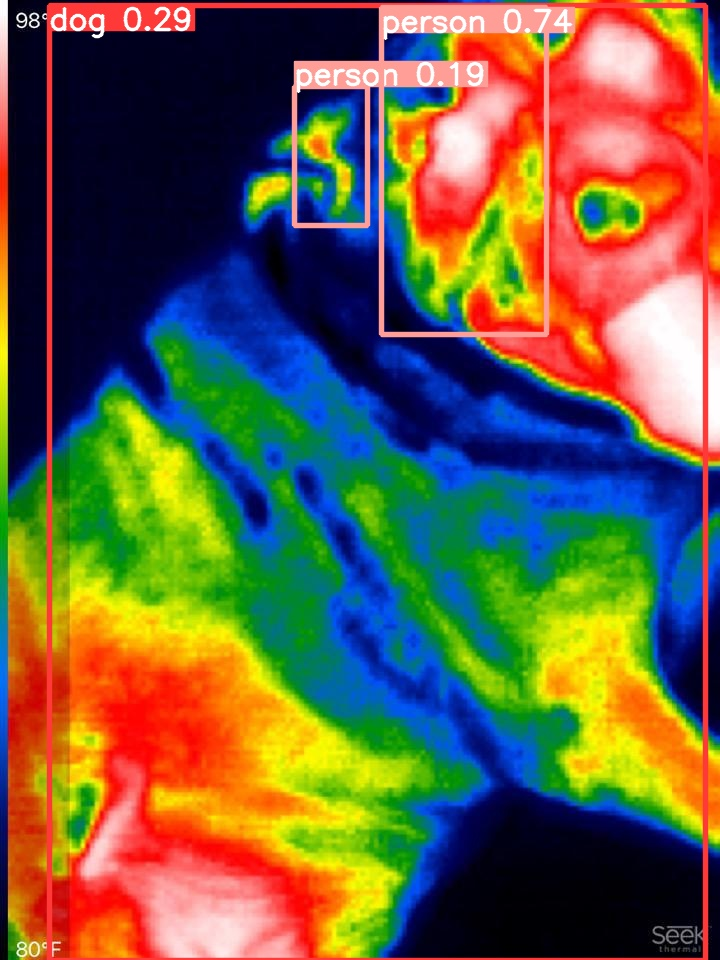

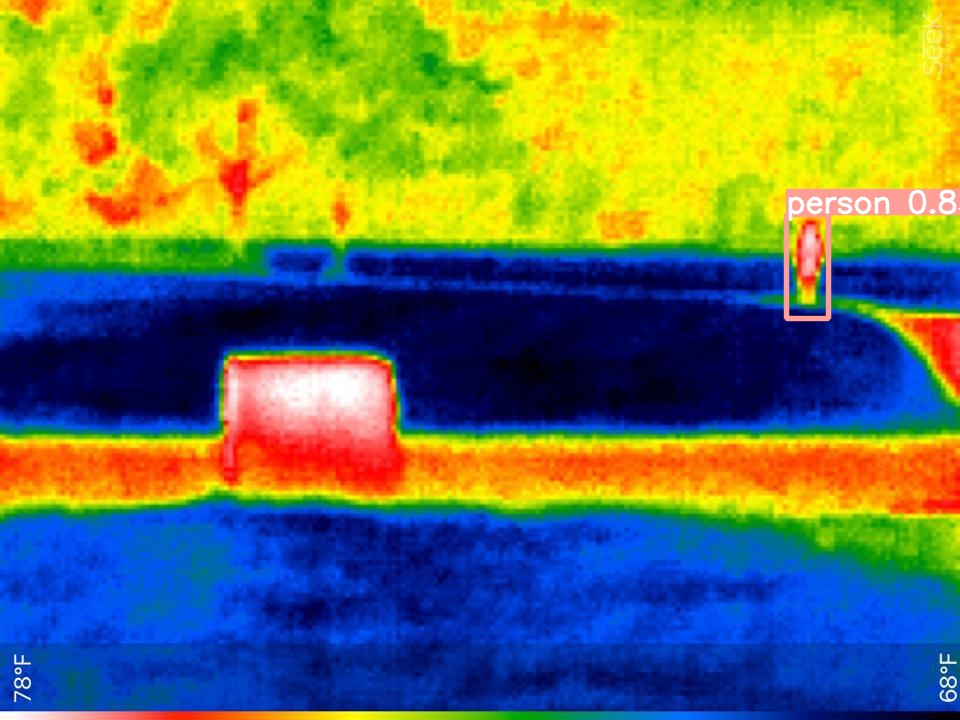

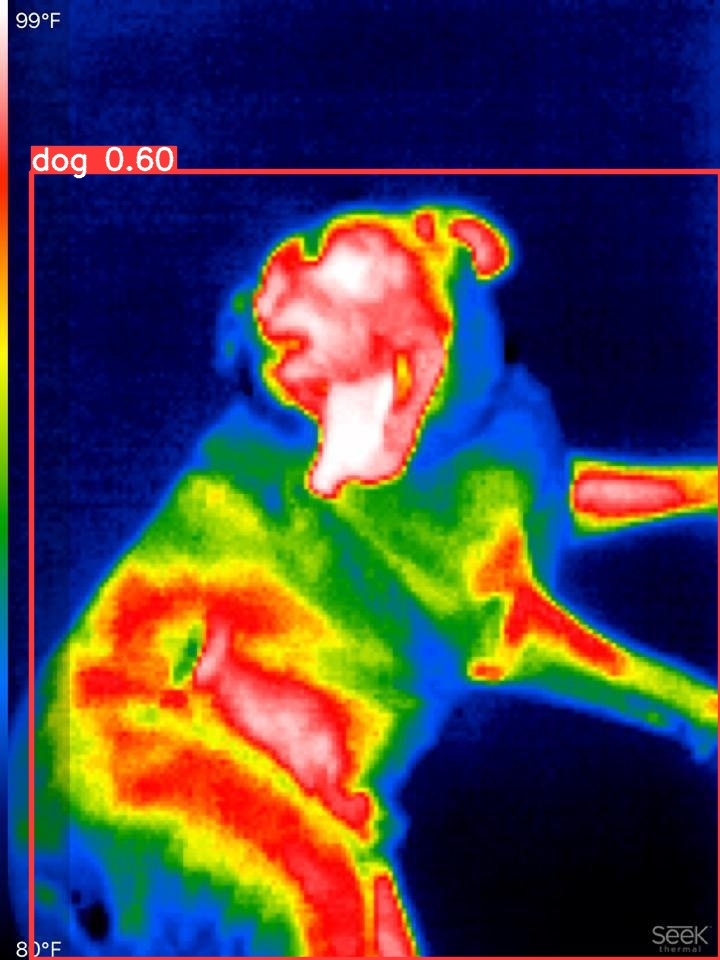

In [16]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")

# Download the weights

In [18]:
from google.colab import files
files.download('./runs/train/exp3/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>